# Analyzing VisiumHD data

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline 

In [ ]:
import os
import pooch
from spatialdata import SpatialData, read_zarr
from sparrow.datasets.registry import get_registry
from sparrow.io._visium_hd import visium_hd
import sparrow as sp
import geopandas as gpd
import uuid

## 1. Read in the data

The first step of the SPArrOW pipeline includes reading in the raw data. The example dataset for this notebook will be downloaded be downloaded and cached using `pooch` via `sparrow.dataset.registry`. It is the mouse small intestine public dataset of 10x Genomics, further information on this dataset can be found [here](https://www.10xgenomics.com/datasets/visium-hd-cytassist-gene-expression-libraries-of-mouse-intestine). 

In [ ]:
registry = get_registry()
unzip_path = registry.fetch(
        "transcriptomics/visium_hd/mouse/visium_hd_mouse_small_intestine.zip",
        processor=pooch.Unzip(),
    )
path = os.path.commonpath(unzip_path)

In [ ]:
import tempfile
# change this path. It is the directory where the spatialdata .zarr will be saved.
OUTPUT_DIR = tempfile.gettempdir()
zarr_path = os.path.join(OUTPUT_DIR, f"sdata_{uuid.uuid4()}.zarr")

In [9]:
sdata = visium_hd(
        path=path,
        bin_size=[2,8,16],
        dataset_id="Visium_HD_Mouse_Small_Intestine",
        bins_as_squares=True,
        output= zarr_path,
    )
sdata

/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


INFO     The instance_key column in 'table.obs' ('table.obs[location_id]') will be relabeled to ensure a numeric   
         data type, with a continuous range and without including the value 0 (which is reserved for the           
         background). The new labels will be stored in a new column named 'relabeled_location_id'.                 


/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


INFO     The instance_key column in 'table.obs' ('table.obs[location_id]') will be relabeled to ensure a numeric   
         data type, with a continuous range and without including the value 0 (which is reserved for the           
         background). The new labels will be stored in a new column named 'relabeled_location_id'.                 
INFO     The instance_key column in 'table.obs' ('table.obs[location_id]') will be relabeled to ensure a numeric   
         data type, with a continuous range and without including the value 0 (which is reserved for the           
         background). The new labels will be stored in a new column named 'relabeled_location_id'.                 


/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:511: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


INFO     The Zarr backing store has been changed from None the new file path:                                      
         /srv/scratch/karenh/sparrow-revision/data/sdata_objects/sdata_VisiumHD_tutorial.zarr                      


version mismatch: detected: RasterFormatV02, requested: FormatV04
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/srv/scratch/karenh/anaconda3/

SpatialData object, with associated Zarr store: /srv/scratch/karenh/sparrow-revision/data/sdata_objects/sdata_VisiumHD_tutorial.zarr
├── Images
│     ├── 'Visium_HD_Mouse_Small_Intestine_full_image': DataTree[cyx] (3, 21943, 23618), (3, 10971, 11809), (3, 5485, 5904), (3, 2742, 2952), (3, 1371, 1476)
│     ├── 'Visium_HD_Mouse_Small_Intestine_hires_image': DataArray[cyx] (3, 5575, 6000)
│     └── 'Visium_HD_Mouse_Small_Intestine_lowres_image': DataArray[cyx] (3, 558, 600)
├── Labels
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um_labels': DataArray[yx] (3285, 3191)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um_labels': DataArray[yx] (822, 799)
│     └── 'Visium_HD_Mouse_Small_Intestine_square_016um_labels': DataArray[yx] (412, 400)
├── Shapes
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um': GeoDataFrame shape: (5479660, 1) (2D shapes)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um': GeoDataFrame shape: (351817, 1) (2D shapes)
│     └── 'Visium_HD_Mou

2026-01-20 13:49:28,620 - sparrow.image._image - INFO - There seems to be more than one coordinate system defined on the provided spatial element ('['Visium_HD_Mouse_Small_Intestine_downscaled_hires', 'Visium_HD_Mouse_Small_Intestine']'). We only consider the coordinate sytem specified via parameter 'to_coordinate_system': 'Visium_HD_Mouse_Small_Intestine_downscaled_hires'.
2026-01-20 13:49:28,624 - sparrow.image._image - INFO - There seems to be more than one coordinate system defined on the provided spatial element ('['Visium_HD_Mouse_Small_Intestine_downscaled_hires', 'Visium_HD_Mouse_Small_Intestine']'). We only consider the coordinate sytem specified via parameter 'to_coordinate_system': 'Visium_HD_Mouse_Small_Intestine_downscaled_hires'.


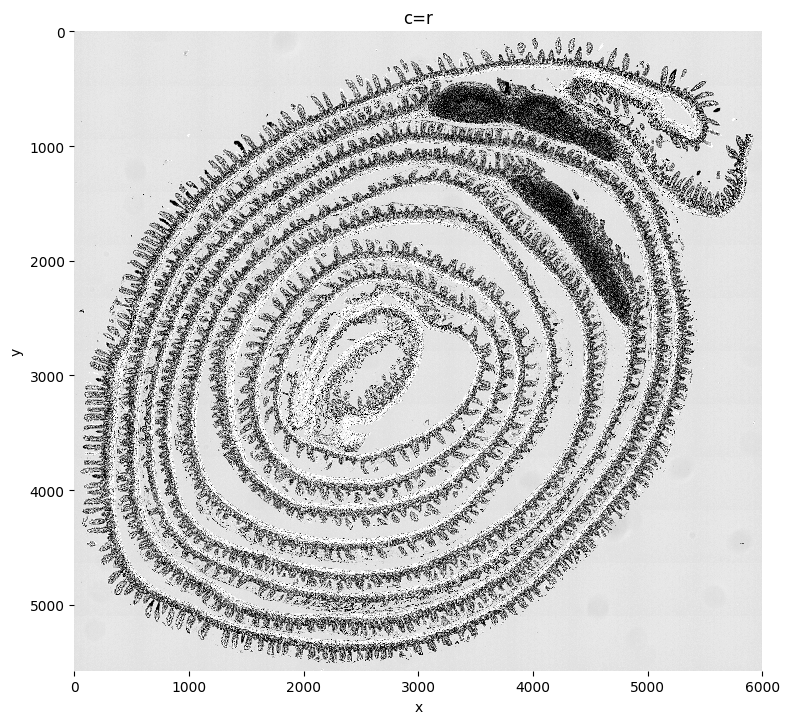

In [10]:
sp.pl.plot_image(sdata, img_layer="Visium_HD_Mouse_Small_Intestine_hires_image", figsize=(8, 8), to_coordinate_system='Visium_HD_Mouse_Small_Intestine_downscaled_hires', channel='r')

We can take a closer look by cropping the image, if we want the best resolution we can plot the Visium_HD_Mouse_Small_Intestine_full_image, however, keep in mind that if you would plot the whole image without cropping, this could take some more time.

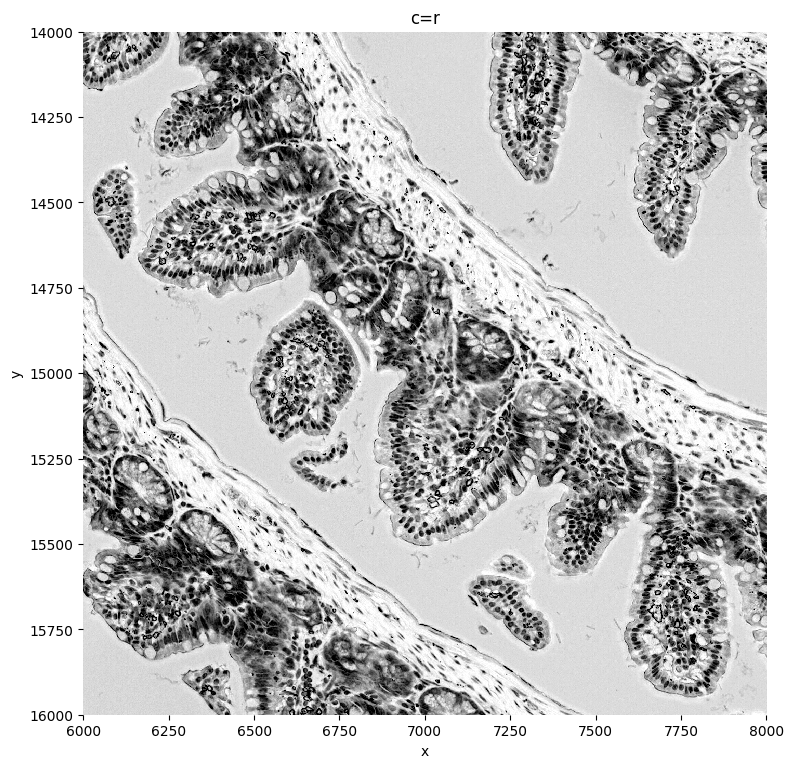

In [11]:
crd = [6000, 8000, 14000, 16000]  # crd used for visualization purposes
sp.pl.plot_image(sdata, img_layer="Visium_HD_Mouse_Small_Intestine_full_image", figsize=(8, 8), crd=crd, to_coordinate_system='Visium_HD_Mouse_Small_Intestine', channel='r')

Let's take a look at the original bins of our data. We can plot them in the default resolution 10x provides, at the 2um, 8um, or 16um level.

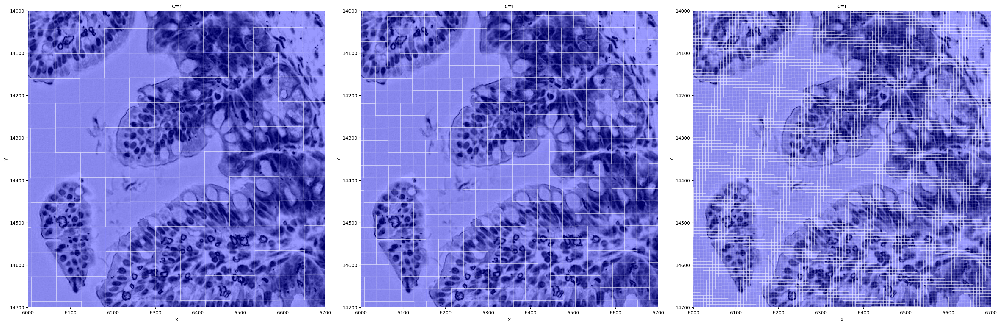

In [12]:
sp.pl.plot_shapes( sdata,
                  img_layer="Visium_HD_Mouse_Small_Intestine_full_image",
                  shapes_layer=["Visium_HD_Mouse_Small_Intestine_square_016um","Visium_HD_Mouse_Small_Intestine_square_008um","Visium_HD_Mouse_Small_Intestine_square_002um"], 
                  crd = [6000, 6700, 14000, 14700],
                  channel = "r",
                  alpha=0.4,
                  to_coordinate_system='Visium_HD_Mouse_Small_Intestine'
                   )

We can also plot specific genes.

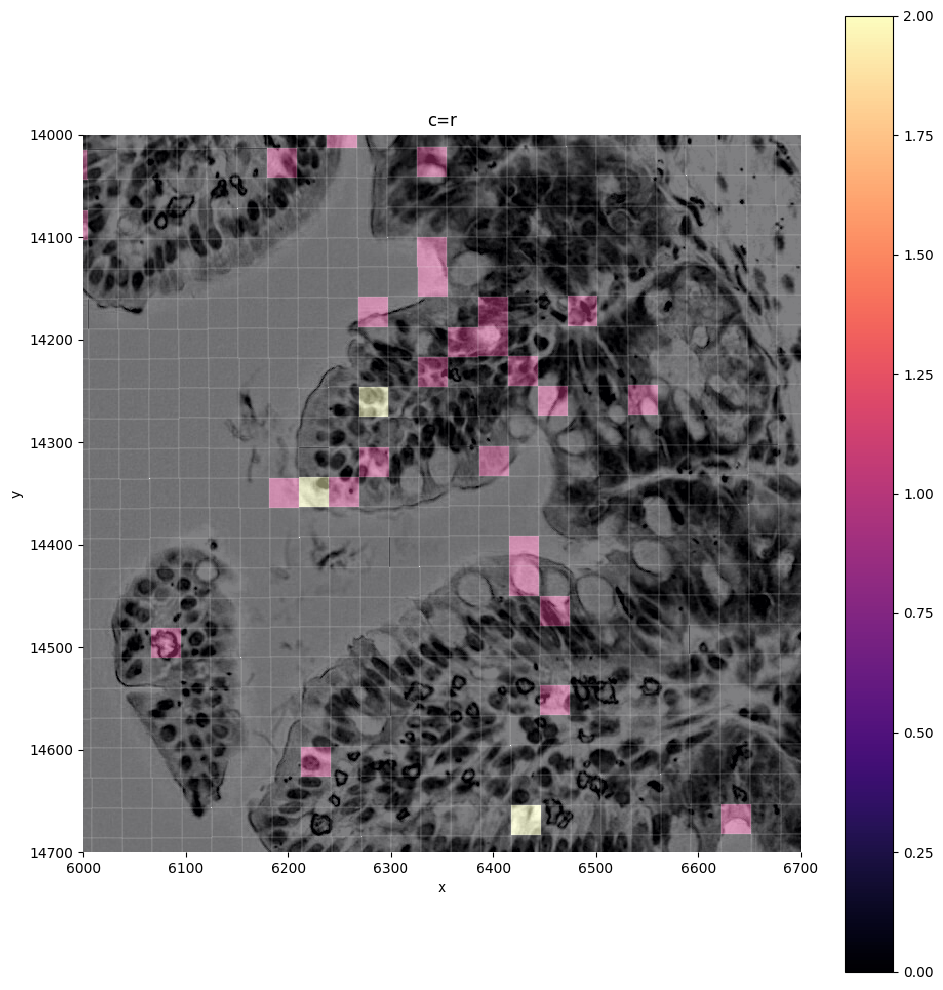

In [13]:
sp.pl.plot_shapes(
    sdata,
    img_layer = "Visium_HD_Mouse_Small_Intestine_full_image",
    shapes_layer="Visium_HD_Mouse_Small_Intestine_square_008um",
    crd = [6000, 6700, 14000, 14700],
    channel="r",
    table_layer = "square_008um",
    column="Lypla1",
    linewidth=0.2,
    to_coordinate_system='Visium_HD_Mouse_Small_Intestine'
      )

## 2. Segmenting the image

Since Visium HD data is a sequencing-based ST technology, the gene expression information is accessed in a grid of 2x2 um bins. 10x also provides the default aggregation of these bins into 8x8 um and 16x16 um. However, if we want to go to single-cell level, we can assign the 2x2 um bins to cells segmented from the provided H&E image. 

### 2.1 Using a provided segmentation mask

For this dataset, 10X has provided a tutorial to segment the nuclei and a custom binning approach, you can find it [here](https://www.10xgenomics.com/analysis-guides/segmentation-visium-hd). We can read in this segmentation mask from the registry.

In [14]:
from spatialdata.transformations import (
    Identity,
    set_transformation
)
path="/srv/scratch/karenh/sparrow-revision/data/VisiumHD"
registry = get_registry( path = path ) 
# registry = get_registry()
path_polygons = registry.fetch( "transcriptomics/visium_hd/mouse/masks.geojson" ) # custom segmentation of H&E
gdf = gpd.read_file(path_polygons)
gdf.index=gdf.index +1
sdata=sp.sh.add_shapes_layer(
    sdata,
    input=gdf,
    output_layer="10X_segmentation_boundaries",
    overwrite=True,
      )
# add it to the correct coordinate system
set_transformation(element=sdata['10X_segmentation_boundaries'], transformation=Identity(), to_coordinate_system='Visium_HD_Mouse_Small_Intestine', write_to_sdata=sdata)
sdata

SpatialData object, with associated Zarr store: /srv/scratch/karenh/sparrow-revision/data/sdata_objects/sdata_VisiumHD_tutorial.zarr
├── Images
│     ├── 'Visium_HD_Mouse_Small_Intestine_full_image': DataTree[cyx] (3, 21943, 23618), (3, 10971, 11809), (3, 5485, 5904), (3, 2742, 2952), (3, 1371, 1476)
│     ├── 'Visium_HD_Mouse_Small_Intestine_hires_image': DataArray[cyx] (3, 5575, 6000)
│     └── 'Visium_HD_Mouse_Small_Intestine_lowres_image': DataArray[cyx] (3, 558, 600)
├── Labels
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um_labels': DataArray[yx] (3285, 3191)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um_labels': DataArray[yx] (822, 799)
│     └── 'Visium_HD_Mouse_Small_Intestine_square_016um_labels': DataArray[yx] (412, 400)
├── Shapes
│     ├── '10X_segmentation_boundaries': GeoDataFrame shape: (369006, 2) (2D shapes)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um': GeoDataFrame shape: (5479660, 1) (2D shapes)
│     ├── 'Visium_HD_Mouse_Small_Intestin

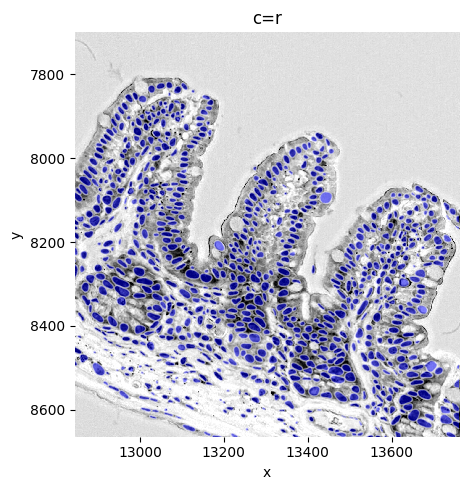

In [15]:
sp.pl.plot_shapes(
    sdata, 
    img_layer="Visium_HD_Mouse_Small_Intestine_full_image",
    shapes_layer="10X_segmentation_boundaries",
    crd =[ 12844, 13760, 7700, 8664 ],
    figsize=(5,5) ,
    channel="r",
    to_coordinate_system='Visium_HD_Mouse_Small_Intestine'
    )

In [16]:
# rasterize shapes layer into a labels layer
labels_layer = "10X_segmentation_mask"
sdata=sp.im.rasterize( sdata, shapes_layer="10X_segmentation_boundaries", output_layer=labels_layer, overwrite=True ) 
set_transformation(element=sdata['10X_segmentation_mask'], transformation=Identity(), to_coordinate_system='Visium_HD_Mouse_Small_Intestine', write_to_sdata=sdata)

2026-01-20 13:51:41,968 - sparrow.image._manager - INFO - Writing results to layer '10X_segmentation_mask'
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)


In [17]:
# bin barcodes to the segmentation masks
sdata=sp.tb.bin_counts( 
    sdata,
    table_layer="square_002um",
    labels_layer="10X_segmentation_mask",
    output_layer="10X_custom_binning",
    to_coordinate_system='Visium_HD_Mouse_Small_Intestine',
    append = False,
    overwrite=True,
      )

2026-01-20 13:53:27,945 - sparrow.image._image - INFO - There seems to be more than one coordinate system defined on the provided spatial element ('['global', 'Visium_HD_Mouse_Small_Intestine']'). We only consider the coordinate sytem specified via parameter 'to_coordinate_system': 'Visium_HD_Mouse_Small_Intestine'.
2026-01-20 13:53:27,966 - sparrow.table._allocation - INFO - Calculating cell counts.
2026-01-20 13:53:35,980 - sparrow.table._allocation - INFO - 
 Number of spots per bin  Frequency
                       1      59852
                       2      86037
                       3      71787
                       4      59368
                       5      32236
                       6      19129
                       7      11249
                       8       6894
                       9       4362
                      10       3060
                      11       1947
                      12       1427
                      13        942
                      14      

2026-01-20 13:54:02,415 - sparrow.plot._plot - WARNING - There are '15' cells in provided shapes_layer '10X_segmentation_boundaries' not found in 'sdata.tables[10X_custom_binning]' (linked through 'cell_ID'), these cells will not be plotted.


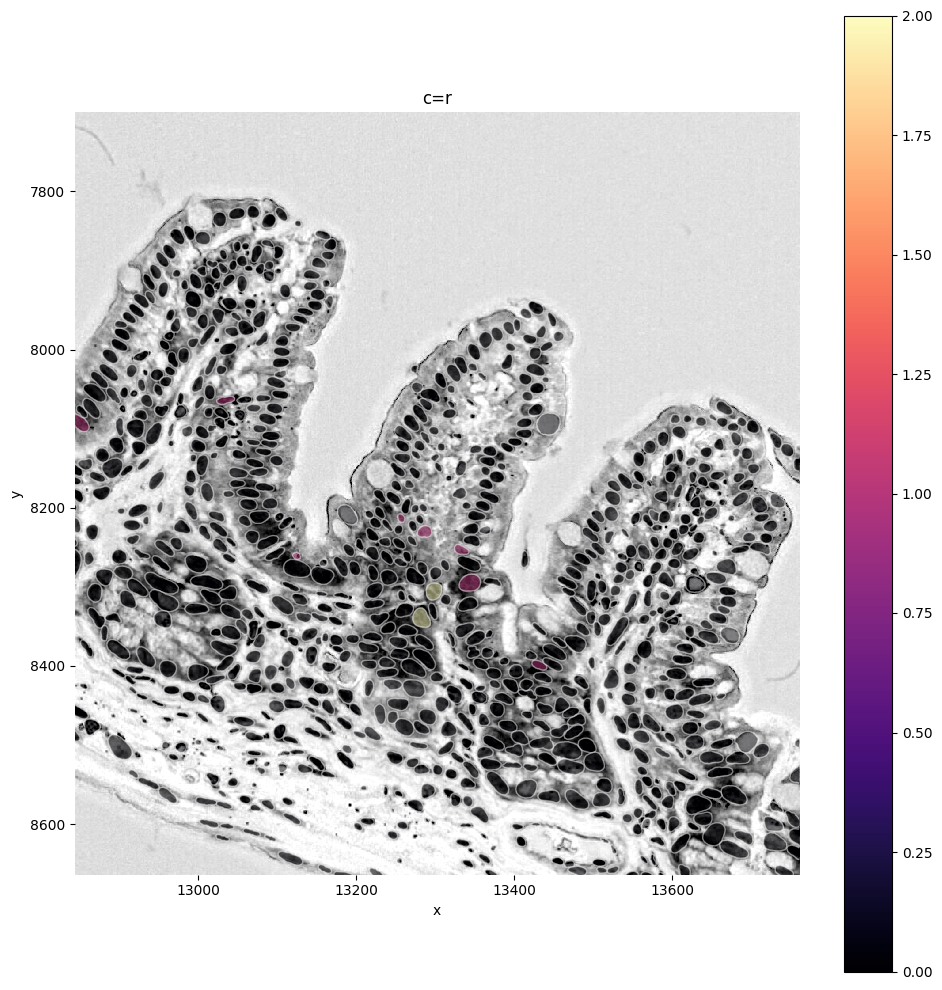

In [18]:
# now we can plot genes onto the individual cells
sp.pl.plot_shapes(
    sdata,
    img_layer = "Visium_HD_Mouse_Small_Intestine_full_image",
    shapes_layer="10X_segmentation_boundaries", # shapes layer corresponding to labels layer
    crd = [ 12844, 13760, 7700, 8664 ],
    to_coordinate_system='Visium_HD_Mouse_Small_Intestine',
    channel="r",
    table_layer = "10X_custom_binning",
    column="Lypla1"
      )



We now have a genes-by-cells table, we can now do further processing steps (normalization, clustering, etc.) on this. These are covered in the general tutorial [here](https://sparrow-pipeline.readthedocs.io/en/latest/tutorials/general/SPArrOW_how_to_start.html#sparrow-how-to-start).

### 2.2 Segmenting the image yourself

Instead of using a segmentation mask provided by 10X, you can also try and segment the H&E image of your Visium HD data yourself. Several segmentation approaches and models are available for this purpose. In this tutorial, we will be using the nuclei model of Cellpose. Although this model is not specifically trained on H&E images, we found that inverting the red channel of the image yields good segmentation performance.

In [19]:
# add inversed red channel to sdata object
img = sdata["Visium_HD_Mouse_Small_Intestine_full_image"].scale0.image
img = img[0:1, :, :]
img_inv = 255 - img
img_inv = img_inv.assign_attrs(img.attrs)
sdata['crop_inv'] = img_inv
sdata


SpatialData object, with associated Zarr store: /srv/scratch/karenh/sparrow-revision/data/sdata_objects/sdata_VisiumHD_tutorial.zarr
├── Images
│     ├── 'Visium_HD_Mouse_Small_Intestine_full_image': DataTree[cyx] (3, 21943, 23618), (3, 10971, 11809), (3, 5485, 5904), (3, 2742, 2952), (3, 1371, 1476)
│     ├── 'Visium_HD_Mouse_Small_Intestine_hires_image': DataArray[cyx] (3, 5575, 6000)
│     ├── 'Visium_HD_Mouse_Small_Intestine_lowres_image': DataArray[cyx] (3, 558, 600)
│     └── 'crop_inv': DataArray[cyx] (1, 21943, 23618)
├── Labels
│     ├── '10X_segmentation_mask': DataArray[yx] (21702, 23331)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um_labels': DataArray[yx] (3285, 3191)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um_labels': DataArray[yx] (822, 799)
│     └── 'Visium_HD_Mouse_Small_Intestine_square_016um_labels': DataArray[yx] (412, 400)
├── Shapes
│     ├── '10X_segmentation_boundaries': GeoDataFrame shape: (369006, 2) (2D shapes)
│     ├── 'Visium_HD_Mous

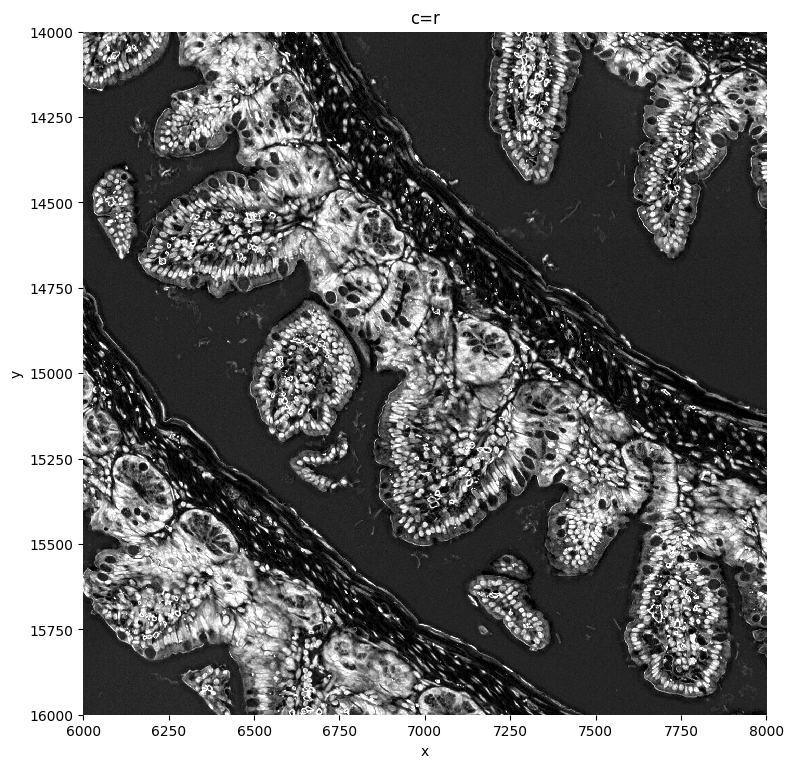

In [20]:
# Let's plot a crop first to see what it looks like
sp.pl.plot_image(sdata, img_layer="crop_inv", figsize=(8, 8), crd=crd, to_coordinate_system='Visium_HD_Mouse_Small_Intestine')

/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
2026-01-20 13:54:58,396 - sparrow.image.segmentation._segmentation - INFO - Linking labels across chunks.
2026-01-20 13:54:58,407 - sparrow.image._manager - INFO - Writing results to layer 'segmentation_mask'
/srv/scratch/karenh/anaconda3/envs/napari-sparrow/lib/python3.10/site-packages/zarr/creation.py:614: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
2026-01-20 13:54:59,023 - sparrow.shape._manager - INFO - Finished vectorizing. Dissolving shapes at the border of the chunks. This can take a couple minutes if input mask contains a lot of chunks.
2026-01-20 13:54:59,183 - sparrow.shape._manager - INFO - Dissolve is done.


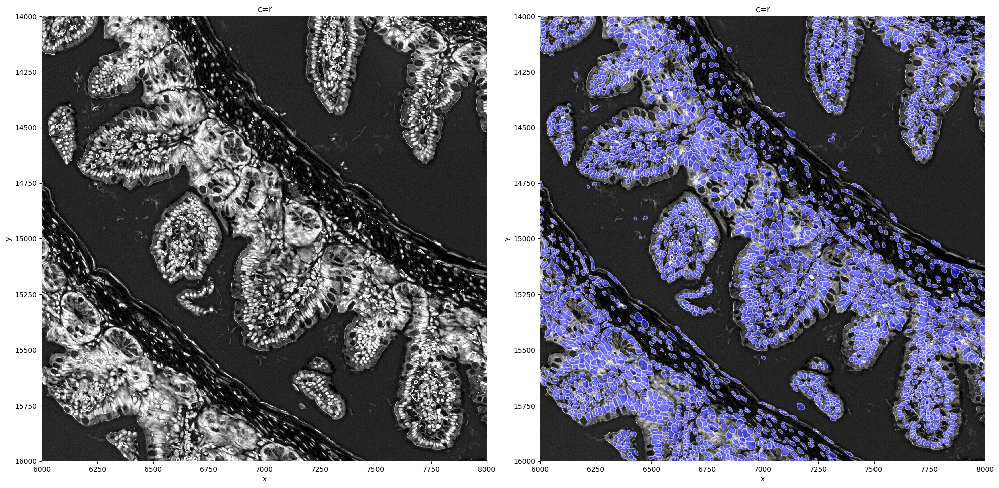

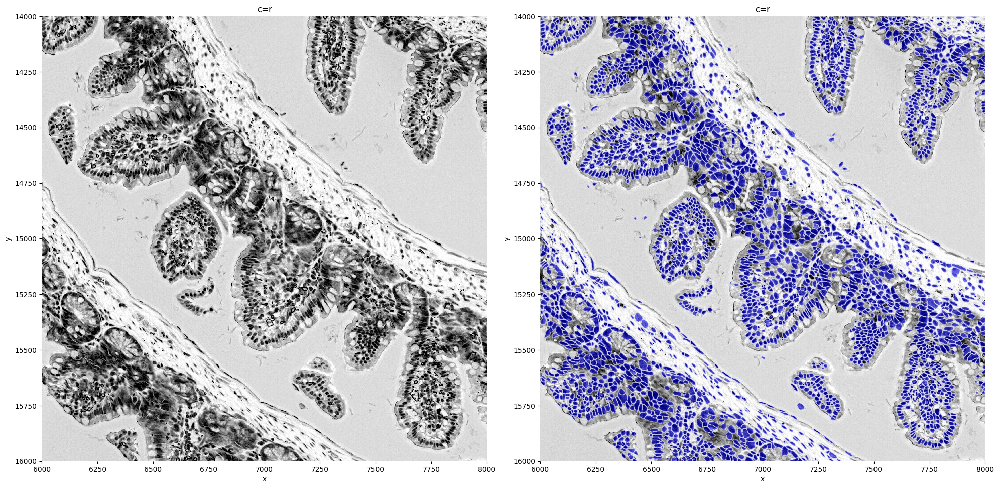

In [21]:
# segment the crop (full image will take some time, so it's best to optimize the parameters on a crop)
sdata = sp.im.segment(
    sdata=sdata,
    img_layer="crop_inv",
    output_labels_layer="segmentation_mask",
    output_shapes_layer="segmentation_mask_boundaries",
    to_coordinate_system='Visium_HD_Mouse_Small_Intestine',
    flow_threshold=0.9,
    diameter=15,
    crd=crd,
    cellprob_threshold=-6,
    pretrained_model="nuclei",
    overwrite=True,
)

sp.pl.segment(sdata=sdata, img_layer="crop_inv", shapes_layer="segmentation_mask_boundaries", crd=crd, to_coordinate_system='Visium_HD_Mouse_Small_Intestine')
sp.pl.segment(sdata=sdata, img_layer="Visium_HD_Mouse_Small_Intestine_full_image", crd=crd, shapes_layer="segmentation_mask_boundaries", to_coordinate_system='Visium_HD_Mouse_Small_Intestine', channel='r')

In [22]:
# now we can again allocate the original 2x2um bins to the segmented cells
sp.table.bin_counts(sdata, table_layer='square_002um', labels_layer='segmentation_mask', output_layer='custom_sc_binning', to_coordinate_system='Visium_HD_Mouse_Small_Intestine', overwrite=True)

2026-01-20 13:55:47,564 - sparrow.table._allocation - INFO - Calculating cell counts.
2026-01-20 13:55:49,678 - sparrow.table._allocation - INFO - 
 Number of spots per bin  Frequency
                       1         60
                       2        181
                       3        249
                       4        359
                       5        383
                       6        433
                       7        340
                       8        239
                       9        172
                      10        127
                      11         91
                      12         80
                      13         60
                      14         54
                      15         32
                      16         31
                      17         15
                      18         18
                      19          9
                      20          7
                      21          8
                      22          7
                      23

SpatialData object, with associated Zarr store: /srv/scratch/karenh/sparrow-revision/data/sdata_objects/sdata_VisiumHD_tutorial.zarr
├── Images
│     ├── 'Visium_HD_Mouse_Small_Intestine_full_image': DataTree[cyx] (3, 21943, 23618), (3, 10971, 11809), (3, 5485, 5904), (3, 2742, 2952), (3, 1371, 1476)
│     ├── 'Visium_HD_Mouse_Small_Intestine_hires_image': DataArray[cyx] (3, 5575, 6000)
│     ├── 'Visium_HD_Mouse_Small_Intestine_lowres_image': DataArray[cyx] (3, 558, 600)
│     └── 'crop_inv': DataArray[cyx] (1, 21943, 23618)
├── Labels
│     ├── '10X_segmentation_mask': DataArray[yx] (21702, 23331)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_002um_labels': DataArray[yx] (3285, 3191)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_008um_labels': DataArray[yx] (822, 799)
│     ├── 'Visium_HD_Mouse_Small_Intestine_square_016um_labels': DataArray[yx] (412, 400)
│     └── 'segmentation_mask': DataArray[yx] (2000, 2000)
├── Shapes
│     ├── '10X_segmentation_boundaries': GeoDataFram

2026-01-20 13:56:08,641 - sparrow.plot._plot - WARNING - There are '30' cells in provided shapes_layer 'segmentation_mask_boundaries' not found in 'sdata.tables[custom_sc_binning]' (linked through 'cell_ID'), these cells will not be plotted.


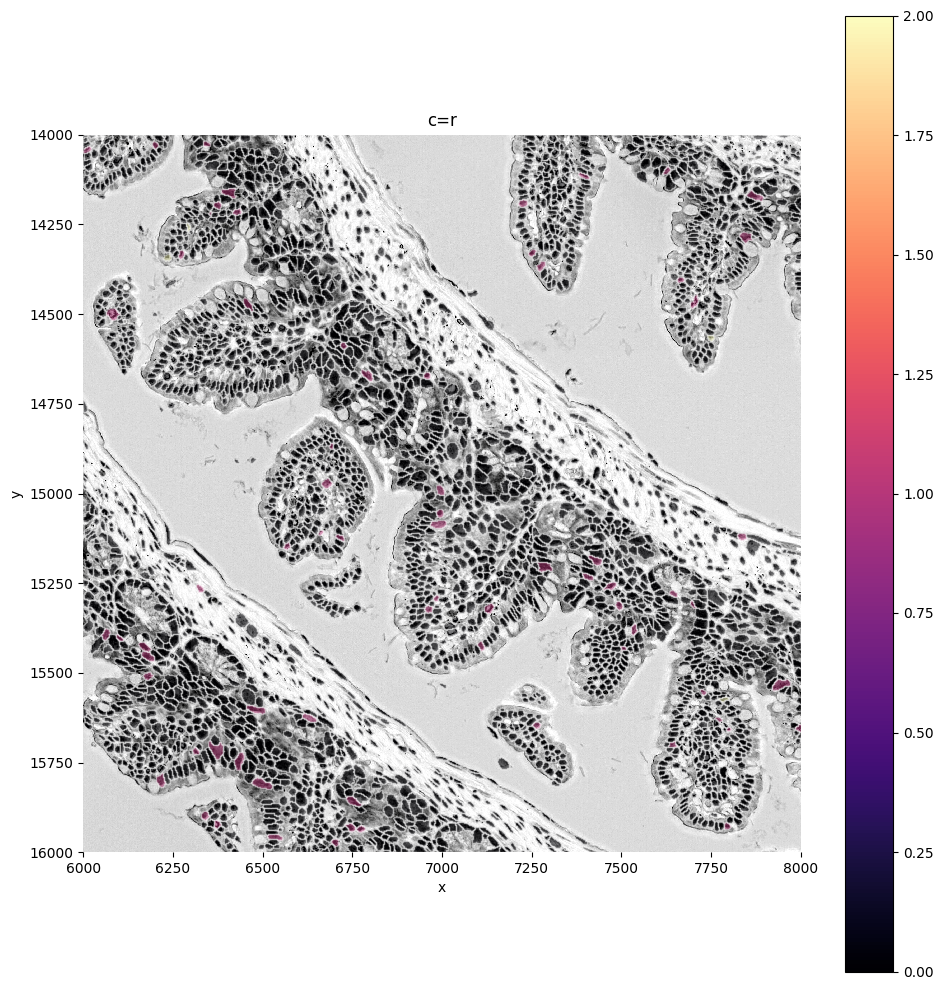

In [23]:
# now we can plot genes onto the individual cells
sp.pl.plot_shapes(
    sdata,
    img_layer = "Visium_HD_Mouse_Small_Intestine_full_image",
    shapes_layer="segmentation_mask_boundaries", # shapes layer corresponding to labels layer
    crd = [6000, 8000, 14000, 16000],
    to_coordinate_system='Visium_HD_Mouse_Small_Intestine',
    channel="r",
    table_layer = "custom_sc_binning",
    column="Lypla1"
      )

We now have a genes-by-cells table, we can now do further processing steps (normalization, clustering, etc.) on this. These are covered in the general tutorial [here](https://sparrow-pipeline.readthedocs.io/en/latest/tutorials/general/SPArrOW_how_to_start.html#sparrow-how-to-start).